<h1 style="text-align: center;"><strong>Customer Personality Analysis</strong></h1>
<p style="text-align: center;"><strong>Kevin Milli</strong></p>

<center>
    <img src="customer-pesonality-analysis.png" width="300" alt="customer analysis">
</center>

<a id="Objective"></a>
<h2 style="text-align: center;"><strong>Objectives and Goal</strong></h2>

I want to start a data research using a *Kaggle* dataset called the [Customer Personality Analysis](https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis). 

**Context:**

Customer Personality Analysis is a detailed analysis of a company’s ideal customers. It helps a business to better understand its customers and makes it easier for them to modify products according to the specific needs, behaviors and concerns of different types of customers.

Customer personality analysis helps a business to modify its product based on its target customers from different types of customer segments. For example, instead of spending money to market a new product to every customer in the company’s database, a company can analyze which customer segment is most likely to buy the product and then market the product only on that particular segment.

---

The **objective** is to begin with an initial exploration, and then proceed with customers segmentation. 

The **goal**  is to determine a specific cluster of affiliation for each customer.

---

<a id="Setup"></a>
<h2 style="text-align: center;"><strong>Setup</strong></h2>

1. Pandas<br>
2. Numpy<br>
3. Matplotlib<br>
4. Seaborn<br>
5. datetime <br>
6. scikit-learn<br>
    cluster's algorithm used:
    - DBSCAN
    - k_means
---

<a id="Data-Description"></a>
<h2 style="text-align: center;"><strong>Data Description</strong></h2>

<h3>People</h3>
<ul>
    <li><strong>ID:</strong> Customer's unique identifier</li>
    <li><strong>Year_Birth:</strong> Customer's birth year</li>
    <li><strong>Education:</strong> Customer's education level</li>
    <li><strong>Marital_Status:</strong> Customer's marital status</li>
    <li><strong>Income:</strong> Customer's yearly household income</li>
    <li><strong>Kidhome:</strong> Number of children in customer's household</li>
    <li><strong>Teenhome:</strong> Number of teenagers in customer's household</li>
    <li><strong>Dt_Customer:</strong> Date of customer's enrollment with the company</li>
    <li><strong>Recency:</strong> Number of days since customer's last purchase</li>
    <li><strong>Complain:</strong> 1 if the customer complained in the last 2 years, 0 otherwise</li>
</ul>

<h3>Products</h3>
<ul>
    <li><strong>MntWines:</strong> Amount spent on wine in the last 2 years</li>
    <li><strong>MntFruits:</strong> Amount spent on fruits in the last 2 years</li>
    <li><strong>MntMeatProducts:</strong> Amount spent on meat in the last 2 years</li>
    <li><strong>MntFishProducts:</strong> Amount spent on fish in the last 2 years</li>
    <li><strong>MntSweetProducts:</strong> Amount spent on sweets in the last 2 years</li>
    <li><strong>MntGoldProds:</strong> Amount spent on gold in the last 2 years</li>
</ul>

<h3>Promotion</h3>
<ul>
    <li><strong>NumDealsPurchases:</strong> Number of purchases made with a discount</li>
    <li><strong>AcceptedCmp1:</strong> 1 if the customer accepted the offer in the 1st campaign, 0 otherwise</li>
    <li><strong>AcceptedCmp2:</strong> 1 if the customer accepted the offer in the 2nd campaign, 0 otherwise</li>
    <li><strong>AcceptedCmp3:</strong> 1 if the customer accepted the offer in the 3rd campaign, 0 otherwise</li>
    <li><strong>AcceptedCmp4:</strong> 1 if the customer accepted the offer in the 4th campaign, 0 otherwise</li>
    <li><strong>AcceptedCmp5:</strong> 1 if the customer accepted the offer in the 5th campaign, 0 otherwise</li>
    <li><strong>Response:</strong> 1 if the customer accepted the offer in the last campaign, 0 otherwise</li>
</ul>

<h3>Place</h3>
<ul>
    <li><strong>NumWebPurchases:</strong> Number of purchases made through the company’s website</li>
    <li><strong>NumCatalogPurchases:</strong> Number of purchases made using a catalogue</li>
    <li><strong>NumStorePurchases:</strong> Number of purchases made directly in stores</li>
    <li><strong>NumWebVisitsMonth:</strong> Number of visits to the company’s website in the last month</li>
</ul>


---

<h2 style="text-align: center;"><strong>Table of contents</strong></h2>

[1. Objectives and Goal](#Objective)<br>
[2. Setup](#Setup)<br>
[3. Data Description](#Data-Description)<br>
[4. Feature Engineering](#FeatureEngineering)<br>
[5. Tools and Function](#ToolsFunction)<br>
[6. Exploratory Data Analysis](#EDA)<br>
[7. RFM Analysis](#RFM)<br>
[8. Data Preprocessing](#DataPreprocessing)<br>
[9. Model Evaluation](#ModelEvaluation)<br>
[10. Cluster Analysis](#clustering)<br>
[11. K-Means](#kmeans)<br>
[12. DBSCAN](#dbscan)<br>
[13. Visual Comparison](#plot)<br>
[14. Conclusios](#conclusions)

---

### Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
from datetime import datetime

from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedShuffleSplit, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, silhouette_score


from sklearn.cluster import DBSCAN, k_means, MeanShift, estimate_bandwidth, KMeans, HDBSCAN
from sklearn.decomposition import KernelPCA


from sklearn.linear_model import LogisticRegression

import warnings

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
sns.set()
warnings.filterwarnings('ignore')

### Data

In [3]:
df = pd.read_csv('marketing_campaign.csv', sep="\t")
df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0


<a id="ToolsFunction"></a>
<h2 style="text-align: center;"><strong>Tools and Functions</strong></h2>

In [4]:
def find_outliers(data, column=None, threshold=2):
    # First quartile (25%) and the third quartile (75%) of the column data
    if data[column].isnull().sum() > 0:
        Q1 = np.nanquantile(data[column], 0.25)
        Q3 = np.nanquantile(data[column], 0.75)
    else:
        Q1 = np.percentile(data[column], 25)
        Q3 = np.percentile(data[column], 75)
    
    # Interquartile range (IQR)
    IQR = Q3 - Q1
    
    # Lower and Upper bounds for outliers
    lower_limit = Q1 - threshold * IQR
    upper_limit = Q3 + threshold * IQR
    
    # Find the outliers within the specified column
    outliers = data[(data[column] < lower_limit) | (data[column] > upper_limit)]
    
    return outliers

<a id="FeatureEngineering"></a>
<h2 style="text-align: center;"><strong>Feature Engineering</strong></h2>

In [5]:
martial_status_map = {
    'Married':'Married',
    'Together':'Together',
    'Single':'Single',
    'Divorced':'Divorced',
    'Widow':'Widow',
    'Alone': 'Single',
    'Absurd': 'Unknown',
    'YOLO': 'Unknown'
}

df['Marital_Status'] = df['Marital_Status'].map(martial_status_map)
df = df[~df['Marital_Status'].isin(['Unknown'])]

In this context, I was unsure whether to combine 'Together' with 'Married.' 

I chose not to make the change since I have limited information about the context, and as it represents a significant number, it could potentially have a detrimental impact on the predictions.

I also remove 4 items without knowing how to reassign 'YOLO' and 'Absurd'.

In [6]:
df['Dt_Customer'] = df['Dt_Customer'].astype(str)

df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y')

In this case, I'm simply converting the column into a `datetime` format so that i can conduct more in-depth searches

In [7]:
df.loc[[192, 239, 339], 'Year_Birth'] = round(df['Year_Birth'].mean())

These three customers (index: 192, 239, 339) were found to be born between 1890 and 1910, so I decided to replace the values with the distribution's mean. 

Given the number of observations (2236), I consider it unlikely that these three observations could significantly impact the results. If I had left them, they would have had a negative influence on the model.

In [8]:
find_outliers(df, 'Income', threshold=2)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
164,8475,1973,PhD,Married,157243.0,0,1,2014-03-01,98,20,2,1582,1,2,1,15,0,22,0,0,0,0,0,0,0,0,3,11,0
617,1503,1976,PhD,Together,162397.0,1,1,2013-06-03,31,85,1,16,2,1,2,0,0,0,1,1,0,0,0,0,0,0,3,11,0
655,5555,1975,Graduation,Divorced,153924.0,0,0,2014-02-07,81,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,3,11,0
687,1501,1982,PhD,Married,160803.0,0,0,2012-08-04,21,55,16,1622,17,3,4,15,0,28,1,0,0,0,0,0,0,0,3,11,0
1300,5336,1971,Master,Together,157733.0,1,0,2013-06-04,37,39,1,9,2,0,8,0,1,0,1,1,0,0,0,0,0,0,3,11,0
1653,4931,1977,Graduation,Together,157146.0,0,0,2013-04-29,13,1,0,1725,2,1,1,0,0,28,0,1,0,0,0,0,0,0,3,11,0
2132,11181,1949,PhD,Married,156924.0,0,0,2013-08-29,85,2,1,2,1,1,1,0,0,0,0,0,0,0,0,0,0,0,3,11,0
2233,9432,1977,Graduation,Together,666666.0,1,0,2013-06-02,23,9,14,18,8,1,12,4,3,1,3,6,0,0,0,0,0,0,3,11,0


In [9]:
# PhD
df.loc[[164, 617, 687, 2132], 'Income'] = df[df['Education']=='PhD']['Income'].median()

# Graduation
df.loc[[655, 1653, 2233], 'Income'] = df[df['Education']=='Graduation']['Income'].median()

# Master
df.loc[[1300], 'Income'] = df[df['Education']=='Master']['Income'].median()

In [10]:
df['Income'] = df['Income'].fillna(df['Income'].median())

In the 'Income' column, there were `24` null values out of a total of `2236` (~ 0.01%). I chose to fill these values with the median.

The reason for choosing the **median** is often because it is a **robust measure of central tendency** that is less affected by outliers compared to the mean.

In [11]:
columns_to_check = ['Z_Revenue', 'Z_CostContact']

for col in columns_to_check:
    element_info = f"The element: {df[col].value_counts().index.values} is repeated: {df[col].value_counts().values} times"
    print(f"{element_info}\n")
    
print("I proceed to remove the two columns that are not significant for the context.")

df = df.drop(columns_to_check, axis=1)

The element: [11] is repeated: [2236] times

The element: [3] is repeated: [2236] times

I proceed to remove the two columns that are not significant for the context.


In [12]:
df["monetary"] = df.loc[:,df.columns.str.contains("Mnt")].sum(axis=1)
df["frequency"] = df.loc[:,df.columns.str.contains("Purchases")].sum(axis=1)

In the cell above, I create two new columns. <br>
**monetary**: where I sum all the **expenses made** by each individual customer in the last 2 years. <br>
**frequency**: Where I sum the **purchase frequency** for each customer in the last 2 years.<br>
This way, I have all the data available to conduct an **RFM** (Recency, Frequency, Monetary) analysis.

In [13]:
df['AveragePurchaseAmount'] = df.apply(lambda row: row['monetary'] / row['frequency'] if row['frequency'] != 0 else 0, axis=1)

df['CampaignAcceptanceRate'] = (df.loc[:,df.columns.str.contains("AcceptedCmp")].sum(axis=1) + df.loc[:, 'Response'])/6

df['WebsiteVisitFrequency'] = df['NumWebVisitsMonth'] / (df['Dt_Customer'].dt.year.max() - df['Dt_Customer'].dt.year + 1)

In the code above, I am creating three new columns:

1. **AveragePurchaseAmount**:
   - Description: This column represents the average amount spent by customers per purchase. It is calculated by dividing the total monetary spending by the total purchase frequency.
   
2. **CampaignAcceptanceRate**:
   - Description: This column measures the average rate of acceptance of marketing campaigns by customers. It is computed by summing the acceptance of individual campaigns ('AcceptedCmp1' to 'AcceptedCmp5') and the response to the last campaign ('Response') and then dividing by 6, which is the total number of campaigns.
   
3. **WebsiteVisitFrequency**:
   - Description: This column indicates the frequency of visits to the company's website by customers. It is calculated by dividing the total number of website visits ('NumWebVisitsMonth') by the number of years since the customer's enrollment with the company. It provides insights into how often customers interact with the company's website.


In [14]:
df.loc[2228, 'AveragePurchaseAmount'] = np.quantile(df['AveragePurchaseAmount'], .99)


df.loc[[1328, 774], 'AveragePurchaseAmount'] = df.AveragePurchaseAmount.median()

- Customer 2228: I corrected the presence of an outlier who, having made a large purchase only once, had shown an average spending amount equal to the total. I adjusted it to the 99th percentile so as not to miss the potential that they could turn out to be an excellent future customer.

- Customers [1328, 774]: These two customers also had one purchase and the other had two purchases. Given their low income, I chose to redirect their spending to the median of the distribution.

In [15]:
# Total number of Childern
df['TotalChildren'] = df['Kidhome'] + df['Teenhome']

df = df.drop(['Kidhome', 'Teenhome'], axis=1)

In [16]:
# 'Year_Birth' column to datetime format
df['Year_Birth'] = pd.to_datetime(df['Year_Birth'], format='%Y')

# Current year
current_year = datetime.now().date().year

# Age of customers
df['Age'] = current_year - df['Year_Birth'].dt.year

# Convert 'Year_Birth' to int64
df['Year_Birth'] = df['Year_Birth'].dt.year.astype('int64')

Here I am simply calculating the subject's age based on the current date and then adding the data to the dataframe, naming the column "Age".

In [17]:
score_df = df.copy()

<a id="EDA"></a>
<h2 style="text-align: center;"><strong>Exploratory Data Analysis</strong></h2>

In [18]:
print(f"""
{'='*50}\nShape:\n- {df.shape[0]} Rows 
- {df.shape[1]} Columns \n{'='*50}\nDtypes:\n{df.dtypes.value_counts().to_frame()}\n{'='*50}\n""")
df.info()


Shape:
- 2236 Rows 
- 32 Columns 
Dtypes:
                count
int64              24
float64             4
object              2
datetime64[ns]      1
int32               1

<class 'pandas.core.frame.DataFrame'>
Index: 2236 entries, 0 to 2239
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   ID                      2236 non-null   int64         
 1   Year_Birth              2236 non-null   int64         
 2   Education               2236 non-null   object        
 3   Marital_Status          2236 non-null   object        
 4   Income                  2236 non-null   float64       
 5   Dt_Customer             2236 non-null   datetime64[ns]
 6   Recency                 2236 non-null   int64         
 7   MntWines                2236 non-null   int64         
 8   MntFruits               2236 non-null   int64         
 9   MntMeatProducts         2236 non-null   int64         
 1

In [19]:
null = df.isnull().sum()
null[null>0]

Series([], dtype: int64)

In [20]:
df.duplicated().sum()

0

### People Analysis

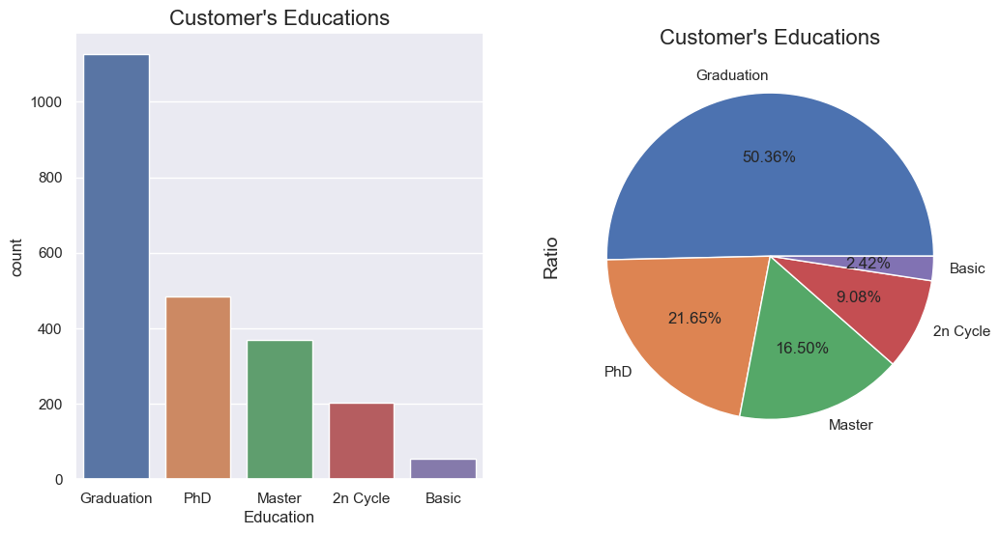

In [21]:
fig, axs = plt.subplots(1,2, figsize=(12,6))

sns.countplot(data=df, x='Education', order=df['Education'].value_counts().sort_values(ascending=False).index, ax=axs[0])
axs[0].set_title('Customer\'s Educations', fontsize=16)

df['Education'].value_counts().plot.pie(ax=axs[1],
                                        autopct='%.2f%%');

axs[1].set_title("Customer\'s Educations", fontsize=16)
axs[1].set_ylabel('Ratio', fontsize=14)
plt.show()

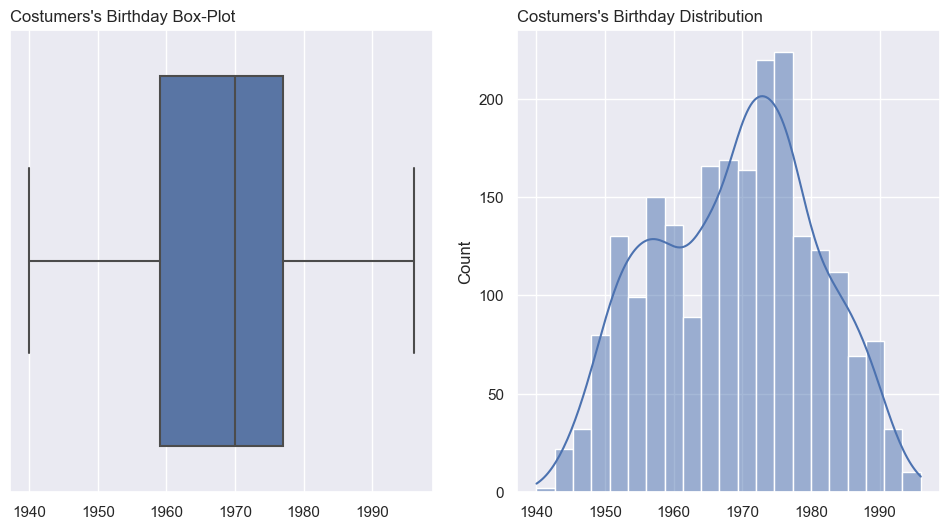

In [22]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

sns.boxplot(data=df, x='Year_Birth', ax=ax[0])
sns.histplot(data=df, x='Year_Birth', kde=True, ax=ax[1])
ax[0].set_title('Costumers\'s Birthday Box-Plot', loc='left')
ax[1].set_title('Costumers\'s Birthday Distribution', loc='left')
ax[0].set_xlabel('')
ax[1].set_xlabel('')
plt.show()

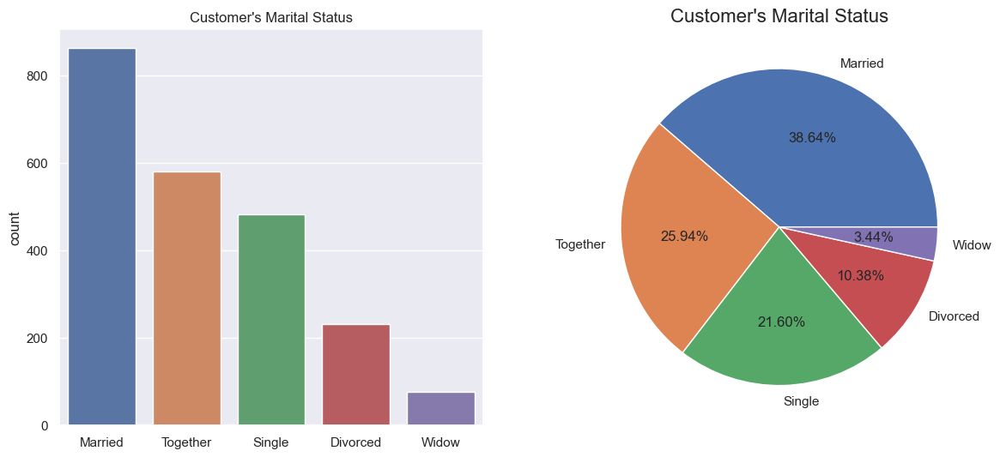

In [23]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))
sns.countplot(data=df, x='Marital_Status', 
              order=df['Marital_Status'].value_counts().sort_values(ascending=False).index,
             ax=axs[0])
axs[0].set_title('Customer\'s Marital Status')
axs[0].set_xlabel('')

df['Marital_Status'].value_counts().plot.pie(ax=axs[1],
                                        autopct='%.2f%%');

axs[1].set_title("Customer\'s Marital Status", fontsize=16)
axs[1].set_ylabel('')
plt.show()

plt.show()

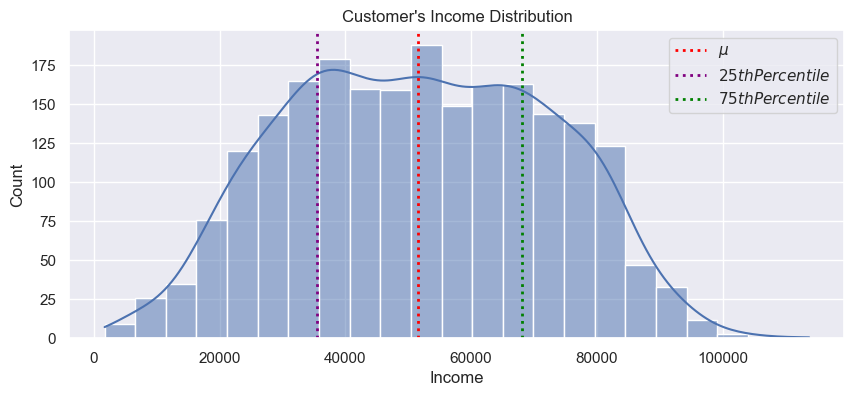

In [24]:
plt.figure(figsize=(10, 4))
sns.histplot(data=df, x='Income', kde=True)
plt.axvline(df.Income.mean(), color='red', linestyle=':', label='$\mu$', linewidth=2)
plt.axvline(np.nanquantile(df.Income,.25), color='purple', linestyle=':', label='$25th Percentile$', linewidth=2)
plt.axvline(np.nanquantile(df.Income,.75), color='green', linestyle=':', label='$75th Percentile$', linewidth=2)
plt.title("Customer's Income Distribution")
plt.legend()
plt.show()

In [25]:
print("Skewness: %f" % df['Income'].skew())

Skewness: 0.013629


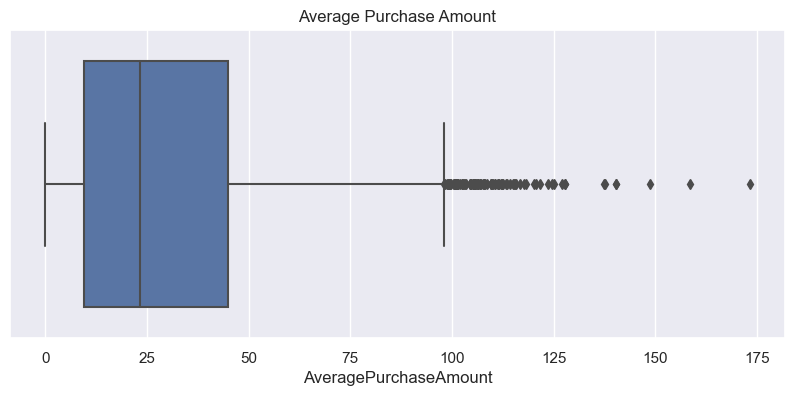

In [26]:
plt.figure(figsize=(10, 4))
sns.boxplot(data=df, x='AveragePurchaseAmount')
plt.title("Average Purchase Amount")
plt.show()

In [27]:
print("Skewness: %f" % df['AveragePurchaseAmount'].skew())

Skewness: 1.279332


In [28]:
find_outliers(data=df, column='AveragePurchaseAmount', threshold=2).sort_values('AveragePurchaseAmount')

,ID,Year_Birth,Education,Marital_Status,Income,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,monetary,frequency,AveragePurchaseAmount,CampaignAcceptanceRate,WebsiteVisitFrequency,TotalChildren,Age
1298,1577,1946,Graduation,Married,78569.0,2014-02-19,14,558,79,622,207,175,95,1,4,6,4,1,0,0,1,0,0,0,1,1736,15,115.733333,0.333333,1.000000,0,77
270,2379,1953,Graduation,Single,69267.0,2012-09-22,31,778,44,499,95,73,146,2,3,4,5,7,0,0,0,0,0,0,1,1635,14,116.785714,0.166667,2.333333,0,70
1961,3009,1962,PhD,Widow,71670.0,2013-07-09,8,1462,16,128,0,0,160,1,5,3,6,6,0,1,1,0,1,0,1,1766,15,117.733333,0.666667,3.000000,0,61
1250,9606,1965,PhD,Married,69969.0,2013-08-27,64,882,29,514,38,29,44,1,4,2,6,3,0,0,1,1,0,0,1,1536,13,118.153846,0.500000,1.500000,0,58
126,11071,1984,Graduation,Single,79607.0,2013-04-21,37,450,133,951,173,0,216,1,3,6,6,1,0,0,0,0,0,0,1,1923,16,120.187500,0.166667,0.500000,0,39
368,5955,1962,Graduation,Together,72025.0,2012-11-17,27,833,33,549,151,133,233,1,4,3,8,3,0,0,0,0,0,0,0,1932,16,120.750000,0.000000,1.000000,0,61
723,10936,1965,Graduation,Married,72190.0,2013-02-13,79,597,166,597,172,166,249,1,5,6,4,3,0,0,0,0,0,0,0,1947,16,121.687500,0.000000,1.500000,0,58
339,1150,1969,PhD,Together,83532.0,2013-09-26,36,755,144,562,104,64,224,1,4,6,4,1,0,0,1,0,0,0,0,1853,15,123.533333,0.166667,0.500000,0,54
1158,7959,1961,Graduation,Married,79410.0,2014-05-29,19,658,80,483,123,13,13,1,3,2,5,1,0,0,0,0,0,0,0,1370,11,124.545455,0.000000,1.000000,0,62
1813,10513,1992,Graduation,Together,63207.0,2013-01-20,68,438,169,565,91,169,70,1,2,3,6,7,0,0,0,1,0,0,0,1502,12,125.166667,0.166667,3.500000,0,31


While I am evaluating outliers with a higher-than-normal threshold parameter of 1.5, we do observe many outliers in this distribution. 

However, these are not outliers due to human errors or calculation mistakes. These customers have a minimum of 10 purchases as frequency, so it is more plausible to consider them as part of a loyal customer category with the ability to spend more money than the average person.

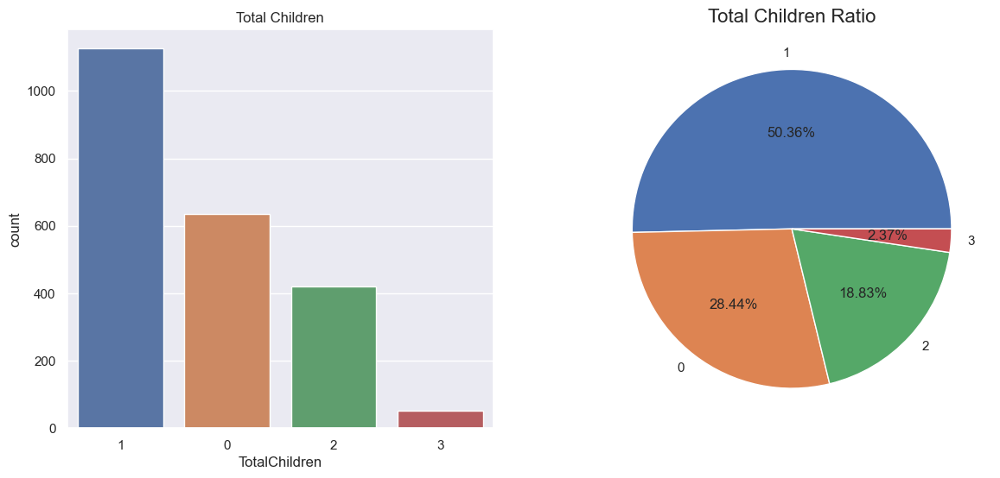

In [29]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))
sns.countplot(data=df, x='TotalChildren', 
              order=df['TotalChildren'].value_counts().sort_values(ascending=False).index,
             ax=axs[0])
axs[0].set_title('Total Children')

df['TotalChildren'].value_counts().plot.pie(ax=axs[1],
                                        autopct='%.2f%%');

axs[1].set_title("Total Children Ratio", fontsize=16)
axs[1].set_ylabel('')
plt.show()

plt.show()

### Products

In [30]:
# MntWines: Amount spent on wine in the last 2 years
# MntFruits: Amount spent on fruits in the last 2 years
# MntMeatProducts: Amount spent on meat in the last 2 years
# MntFishProducts: Amount spent on fish in the last 2 years
# MntSweetProducts: Amount spent on sweets in the last 2 years
# MntGoldProds: Amount spent on gold in the last 2 years

prods = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
df[prods].describe().round(2)

,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds
count,2236.00,2236.00,2236.00,2236.00,2236.00,2236.00
mean,303.87,26.27,166.92,37.41,27.08,43.88
std,336.88,39.76,225.78,54.44,41.30,51.98
min,0.00,0.00,0.00,0.00,0.00,0.00
25%,23.00,1.00,16.00,3.00,1.00,9.00
50%,173.00,8.00,67.00,12.00,8.00,24.00
75%,505.00,33.00,232.00,50.00,33.00,56.00
max,1493.00,199.00,1725.00,259.00,263.00,362.00


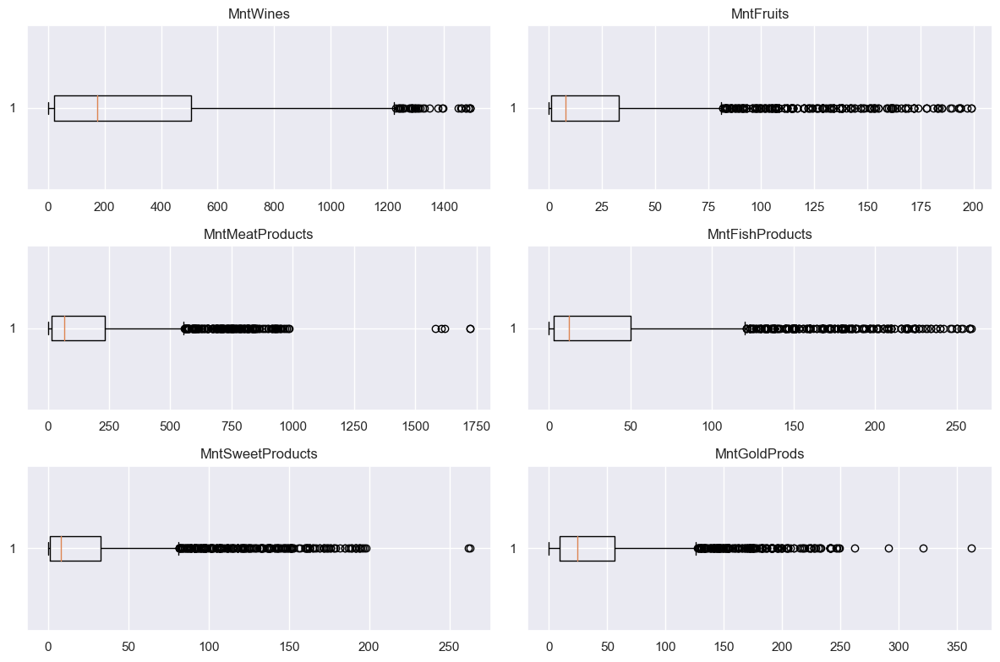

In [31]:
# Create a figure with 3 rows and 2 columns of subplots
fig, axs = plt.subplots(3, 2, figsize=(12, 8))

# Iterate through the specified columns and create a boxplot for each
for idx, prod_col in enumerate(prods):
    row = idx // 2  # Calculate the row where to place the boxplot
    col = idx % 2   # Calculate the column where to place the boxplot
    ax = axs[row, col]  # corresponding axis

    ax.boxplot(df[prod_col], vert=False)  
    ax.set_title(prod_col)  # boxplot title with the column name

# Add spacing between the subplots
plt.tight_layout()

# Show the plot
plt.show()

In [32]:
for col in prods:
    print(f"The Skewness of {col} is:                                {df[col].skew().round(4)}")           
    print(f"After Logarithmic Transformation Skewness for {col} is:  {np.log1p(df[col]).skew().round(4)}") 
    print("="*80)

The Skewness of MntWines is:                                1.1755
After Logarithmic Transformation Skewness for MntWines is:  -0.5445
The Skewness of MntFruits is:                                2.1067
After Logarithmic Transformation Skewness for MntFruits is:  0.084
The Skewness of MntMeatProducts is:                                2.0842
After Logarithmic Transformation Skewness for MntMeatProducts is:  -0.0818
The Skewness of MntFishProducts is:                                1.9241
After Logarithmic Transformation Skewness for MntFishProducts is:  -0.0534
The Skewness of MntSweetProducts is:                                2.1354
After Logarithmic Transformation Skewness for MntSweetProducts is:  0.0847
The Skewness of MntGoldProds is:                                1.8869
After Logarithmic Transformation Skewness for MntGoldProds is:  -0.3413


 <a id="RFM"></a>
<h2 style="text-align: center;"><strong>RFM Analysis</strong></h2>

In [33]:
rfm = df[["ID","Recency","frequency","monetary"]]
rfm.head(2)

,ID,Recency,frequency,monetary
0,5524,58,25,1617
1,2174,38,6,27


In [34]:
rfm.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,2236.0,5591.551878,3245.240106,0.0,2828.25,5458.5,8427.75,11191.0
Recency,2236.0,49.147138,28.954880,0.0,24.00,49.0,74.00,99.0
frequency,2236.0,14.854204,7.681422,0.0,8.00,15.0,21.00,44.0
monetary,2236.0,605.436047,602.507355,5.0,68.00,395.5,1044.25,2525.0


As we can see by the cell above **recency** and **frequency** have minimum values of zero. <br>
These metrics should not have zero values, i proceed to save a dataframe with values greater than 0.

In [35]:
rfm = rfm = rfm[(rfm["frequency"] > 0) & (rfm["Recency"] > 0)]

In [36]:
print(f"The shape is: {rfm.shape}\nDescription:")
rfm.describe().T

The shape is: (2204, 4)
Description:


,count,mean,std,min,25%,50%,75%,max
ID,2204.0,5589.762250,3237.324136,0.0,2834.75,5468.0,8416.5,11191.0
Recency,2204.0,49.750907,28.601527,1.0,25.00,50.0,74.0,99.0
frequency,2204.0,14.878403,7.659143,1.0,8.00,15.0,21.0,44.0
monetary,2204.0,608.497731,604.352583,8.0,68.00,397.0,1048.0,2525.0


In [37]:
# set the scores

# qcut():  
# Discretize variable into equal-sized buckets
# based on rank or based on sample quantiles.

rfm["recency_score"] = pd.qcut(rfm["Recency"], q=5 , labels=[5,4,3,2,1])
rfm["frequency_score"] = pd.qcut(rfm["frequency"], q=5 , labels=[1,2,3,4,5])
rfm["monetary_score"] = pd.qcut(rfm["monetary"], q=5 , labels=[1,2,3,4,5])

In [38]:
# Calculate the RF score
rfm['RF_SCORE'] = rfm['recency_score'].astype(str) + rfm['frequency_score'].astype(str)

# Define segment names using a dictionary
segment_names = {
    '11': 'Hibernating',
    '12': 'Hibernating',
    '21': 'Hibernating',
    '22': 'Hibernating',
    '13': 'At Risk',
    '14': 'At Risk',
    '23': 'At Risk',
    '24': 'At Risk',
    '15': 'Cant Lose',
    '25': 'Cant Lose',
    '31': 'About to Sleep',
    '32': 'About to Sleep',
    '34': 'Loyal Customers', 
    '35': 'Loyal Customers', 
    '44': 'Loyal Customers',
    '45': 'Loyal Customers',
    '42': 'Potential Loyalists',
    '43': 'Potential Loyalists',
    '52': 'Potential Loyalists',
    '53': 'Potential Loyalists',
    '54': 'Champions',
    '55': 'Champions',
    '51': 'New Customers',
    '33': 'Need Attention',
    '41': 'Promising'
}


# Assign segment names based on the RF score
rfm['segment'] = rfm['RF_SCORE'].map(segment_names)

Created regex dictionary and used it for segment our customers based on their RF score

The priority order for metric importance in **RFM Score** calculation is as follows: frequency > recency > monetary. 

**Customer Segmentation Explanations**:

- **About_to_sleep:** Customers in this group have shown signs of reduced activity. Encourage them to re-engage by running stimulating campaigns. You can utilize special offers, discounts, or loyalty programs to regain their interest.

- **At_risk:** Customers in this segment are at risk of leaving. To retain them, provide special offers or discounts. Additionally, offer personalized services to enhance customer satisfaction.

- **Cant_loose:** Customers in this category have demonstrated loyalty. Strengthen their loyalty by offering loyalty programs or special privileges to reward their commitment.

- **Champions:** Customer loyalty is high in this group. Keep them engaged by offering special deals or loyalty programs. Also, consider their feedback to improve your products or services.

- **Hibernating:** Implement campaigns to rekindle the interest of customers in this segment. Strategies such as sending personalized offers or reminders could be utilized.

- **Loyal_customers:** Customers here exhibit strong loyalty. Offer them exclusive deals or privileges to reinforce their commitment. Collect their recommendations and feedback to enhance service quality.

- **Need_attention:** Attract the attention of customers in this category by providing personalized offers or services. Excellent customer support is vital to enhance customer satisfaction.

- **New_customers:** Welcome these customers with introductory offers or discounts to establish their loyalty. Gather their feedback to improve your products or services.

- **Potential_loyalist:** Enhance customer loyalty in this segment by offering personalized deals or exclusive privileges. Regular interaction is crucial to increase brand awareness.

- **Promising:** Attract the interest of customers in this group by implementing special offers or campaigns. Providing a good customer experience is essential to enhance customer satisfaction.


![RFM Table](RFM_table.jpg)

In [39]:
rfm[["segment", "Recency", "frequency", "monetary"]].groupby("segment").agg(["mean", "count"])

Recency        frequency           monetary      
                          mean count       mean count         mean count
segment                                                                 
About to Sleep       50.119048   168   6.934524   168    79.160714   168
At Risk              78.586842   380  17.465789   380   877.692105   380
Cant Lose            80.062893   159  25.981132   159  1205.918239   159
Champions            10.103659   164  22.932927   164  1102.323171   164
Hibernating          80.145773   343   7.072886   343    84.306122   343
Loyal Customers      40.135447   347  23.152738   347  1109.876081   347
Need Attention       50.641975    81  14.888889    81   615.679012    81
New Customers        10.260870   115   5.373913   115    47.113043   115
Potential Loyalists  20.265060   332  12.629518   332   445.265060   332
Promising            30.904348   115   5.400000   115    40.217391   115

**About to Sleep**:<br>
Mean Recency: 50.12 days <br>
Mean Frequency: 6.93 purchases <br>
Mean Monetary: 79.16 monetary units <br>
Number of customers: 168 <br>
This segment includes customers with a mean Recency of approximately 50.12 days. They make an average of fewer than 7 purchases in the last two years and have spent about 79.16 monetary units. These customers might be considered at risk and could benefit from reactivation marketing campaigns.

**At Risk**:<br>
Mean Recency: 78.59 days<br>
Mean Frequency: 17.47 purchases<br>
Mean Monetary: 877.69 monetary units<br>
Number of customers: 380<br>
This segment includes customers with a mean Recency of about 78.59 days. They make an average of approximately 17.47 purchases and have spent about 877.69 monetary units. These customers might be considered at risk of attrition and could benefit from customer retention strategies.

**Cant Lose**:<br>
Mean Recency: 89.94 days<br>
Mean Frequency: 25.86 purchases<br>
Mean Monetary: 1238.49 monetary units<br>
Number of customers: 80<br>
This segment includes customers with a mean Recency of about 89.94 days. They make an average of over 25 purchases and have spent approximately 1238.49 monetary units. These customers are extremely loyal and high-value and require retention and incentive strategies.

**Champions**:<br>
Mean Recency: 10.02 days<br>
Mean Frequency: 22.89 purchases<br>
Mean Monetary: 1094.15 monetary units<br>
Number of customers: 166<br>
This segment includes customers with a mean Recency of about 10.02 days. They make an average of approximately 22.89 purchases and have spent about 1094.15 monetary units. These are the most loyal customers with a high monetary value and require retention strategies.

**Hibernating**:<br>
Mean Recency: 80.15 days<br>
Mean Frequency: 7.07 purchases<br>
Mean Monetary: 84.31 monetary units<br>
Number of customers: 343<br>
This segment includes customers with a mean Recency of approximately 80.15 days. They make an average of about 7.07 purchases and have spent around 84.31 monetary units. These customers have limited engagement and require reactivation strategies.

**Loyal Customers**:<br>
Mean Recency: 40.19 days<br>
Mean Frequency: 23.15 purchases<br>
Mean Monetary: 1110.18 monetary units<br>
Number of customers: 348<br>
This segment includes customers with a mean Recency of about 40.19 days. They make an average of approximately 23.15 purchases and have spent about 1110.18 monetary units. These customers are loyal and high-value, requiring retention strategies.

**Need Attention**:<br>
Mean Recency: 50.61 days<br>
Mean Frequency: 14.91 purchases<br>
Mean Monetary: 622.43 monetary units<br>
Number of customers: 82<br>
This segment includes customers with a mean Recency of approximately 50.61 days. They make an average of about 14.91 purchases and have spent around 622.43 monetary units. These customers require attention and customer retention strategies.

**New Customers**:<br>
Mean Recency: 10.26 days<br>
Mean Frequency: 5.37 purchases<br>
Mean Monetary: 47.11 monetary units<br>
Number of customers: 115<br>
This segment includes new customers with a mean Recency of about 10.26 days. They make an average of approximately 5.37 purchases and have spent around 47.11 monetary units. These customers require acquisition and retention strategies.

**Potential Loyalists**:<br>
Mean Recency: 20.27 days<br>
Mean Frequency: 12.63 purchases<br>
Mean Monetary: 445.27 monetary units<br>
Number of customers: 332<br>
This segment includes customers with a mean Recency of approximately 20.27 days. They make an average of about 12.63 purchases and have spent around 445.27 monetary units. These customers have potential for loyalty.

**Promising**:<br>
Mean Recency: 30.90 days<br>
Mean Frequency: 5.40 purchases<br>
Mean Monetary: 40.22 monetary units<br>
Number of customers: 115<br>
This segment includes customers with a mean Recency of about 30.90 days. They make an average of approximately 5.40 purchases and have spent around 40.22 monetary units.





In [40]:
rfm.shape, df.shape

((2204, 9), (2236, 32))

In [41]:
# Extract IDs from both DataFrames 'rfm' and 'df'
ids_rfm = set(rfm['ID'])
ids_df = set(df['ID'])

# Find the missing IDs
missing_ids = ids_df - ids_rfm

# Convert the missing IDs to a list
missing_ids_list = list(missing_ids)

# Print the missing IDs
print("Missing ID:", missing_ids_list)

Missing ID: [1, 9477, 5642, 2964, 10521, 2079, 1826, 10530, 11181, 5555, 7348, 5430, 10175, 1473, 837, 1991, 10311, 4047, 10968, 4065, 5985, 10470, 11110, 4073, 1386, 2795, 10476, 2285, 8432, 115, 3955, 5371]


In [42]:
# Create a dictionary to map IDs to RFM segments
rfm_mapping = dict(zip(rfm['ID'], rfm['segment']))

# Add the 'RFM_segmentation' column to the 'df' DataFrame
score_df['RFM_segmentation'] = score_df['ID'].map(rfm_mapping)

# Replace NaN values with "Unknown" for non-matching IDs
score_df['RFM_segmentation'].fillna("Unknown", inplace=True)

In [43]:
# Create a list of columns to plot
score_col = ["recency_score", "frequency_score", "monetary_score"]

for column in score_col:
    print(rfm[column].value_counts())

recency_score
2    465
4    454
5    446
3    422
1    417
Name: count, dtype: int64
frequency_score
1    546
4    456
3    450
5    413
2    339
Name: count, dtype: int64
monetary_score
1    445
5    441
3    440
4    440
2    438
Name: count, dtype: int64


This analysis reveals important details about the distribution of scores within each category, with a particular emphasis on the position of the best and worst scores. This information will help us better understand our customers' behavior and adapt our marketing strategies more effectively.

---

### Correlation Analysis

In [44]:
# Calculate the correlation matrix
corr = df.corr(numeric_only=True)

# Fill NaN values with 0
corr.fillna(0, inplace=True)

# Set the main diagonal (correlation values of each variable with itself) to 0.0
for column in corr.columns:
    corr.at[column, column] = 0.0

# Remove rows and columns with all NaN values
corr = corr.dropna(how='all', axis=0).dropna(how='all', axis=1)

# Find the index of the column with the highest correlation value for each variable
max_corr_columns = corr.abs().idxmax()

# Find the maximum correlation value for each variable
max_corr_values = corr.max()

# Create a DataFrame to display the results
corr_df = max_corr_columns.to_frame(name='Most_Correlated_Variable')

# Add a 'Correlation_Degree' column to corr_df
corr_df['Correlation_Degree'] = max_corr_values

# Print the resulting DataFrame
corr_df

,Most_Correlated_Variable,Correlation_Degree
ID,Recency,0.033947
Year_Birth,Age,0.118483
Income,monetary,0.817524
Recency,Response,0.024041
MntWines,monetary,0.892180
MntFruits,monetary,0.613802
MntMeatProducts,monetary,0.843203
MntFishProducts,monetary,0.643105
MntSweetProducts,monetary,0.603283
MntGoldProds,monetary,0.524150


- **Income** (Reddito) and **monetary** (Spesa Monetaria):

This positive correlation of 0.817654 suggests that individuals with higher incomes tend to spend more. <br>This could be attributed to the fact that those with higher incomes have greater financial resources at their disposal, which can influence their spending decisions. For example, they might be more inclined to invest in luxury products or increase their overall expenditure. <br>From a marketing perspective, this aspect is interesting, as businesses may target high-income customers to promote high-end products.

- **MntWines** (Spesa in Vini) and **monetary** (Spesa Monetaria):

The strong positive correlation of 0.891839 suggests that people who spend more on wines tend to be big spenders in general.<br> This may reflect a certain lifestyle or personal preferences. For example, those who appreciate high-quality wines might be willing to invest in other luxury experiences or related products, such as gourmet foods. This correlation could be valuable for wineries and wine retailers to better understand their target market.

- **NumDealsPurchases** (Numero di Acquisti con Sconto) and **TotalChildren** (Numero Totale di Figli):

This positive correlation might indicate that individuals who make more discounted purchases tend to have more children.<br> This could be due to the fact that families with more children seek savings opportunities, making them more likely to accept offers and discounts.

- **Response** (Risposta a Offerte Promozionali) and **CampaignAcceptanceRate** (Tasso di Accettazione della Campagna):

This positive correlation of 0.724600 suggests that individuals who have responded positively to promotional offers in the past tend to have a high campaign acceptance rate. This can be significant for marketing teams, indicating that customers who have been responsive to campaigns in the past are more likely to continue accepting future offers.

- **frequency** (Frequenza di Acquisto) and **NumStorePurchases** (Numero di Acquisti in Negozio):

The positive correlation of 0.820259 suggests that customers who make more purchases directly in stores tend to have a higher overall purchase frequency. This may mean that some individuals prefer physical in-store shopping over online purchases, which can be relevant for sales and marketing strategies.

<a id="DataPreprocessing"></a>
<h2 style="text-align: center;"><strong>Data Preprocessing</strong></h2>

In [45]:
data = df.copy()

In [46]:
cat_col = [col for col in df.columns if df[col].dtype == np.object_]
num_col = [col for col in df.columns if df[col].dtype in [np.int64, np.float64, np.int32]]
num_col.remove('ID')
other = [col for col in df.columns if col not in cat_col and col not in num_col]


dummy_variables = pd.get_dummies(data, columns=cat_col, drop_first=False, dtype=int)

In [47]:
scaler = StandardScaler()

scaled_num = scaler.fit_transform(data[num_col])
scaled_num_df  = pd.DataFrame(scaled_num, columns=num_col)

In [48]:
dummy_variables = dummy_variables.drop(num_col, axis = 1)

processed_df = pd.concat([dummy_variables, scaled_num_df], axis = 1)

In [49]:
processed_df = processed_df.dropna()

In [50]:
processed_df.shape

(2232, 40)

In [51]:
processed_df.head(3)

,ID,Dt_Customer,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,Year_Birth,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,monetary,frequency,AveragePurchaseAmount,CampaignAcceptanceRate,WebsiteVisitFrequency,TotalChildren,Age
0,5524.0,2012-09-04,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,-1.017558,0.316809,0.305815,0.983151,1.552834,1.679346,2.473052,1.475323,0.848972,0.350536,1.409536,2.513883,-0.550059,0.694027,-0.28041,-0.284104,-0.279482,-0.261387,-0.116616,-0.097369,2.394773,1.679299,1.321118,1.137325,0.623073,-0.367119,-1.265354,1.017558
1,2174.0,2014-03-08,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,-1.274243,-0.256590,-0.385069,-0.869573,-0.635710,-0.712913,-0.650537,-0.631638,-0.728921,-0.167164,-1.109252,-0.568204,-1.164870,-0.130983,-0.28041,-0.284104,-0.279482,-0.261387,-0.116616,-0.097369,-0.417576,-0.960263,-1.152936,-0.985142,-0.501375,1.120654,1.395042,1.274243
2,4141.0,2013-08-21,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.333063,0.971933,-0.799600,0.362607,0.571763,-0.176870,1.352235,-0.147279,-0.036187,-0.684864,1.409536,-0.225750,1.294377,-0.543488,-0.28041,-0.284104,-0.279482,-0.261387,-0.116616,-0.097369,-0.417576,0.283154,0.800265,0.159409,-0.501375,-0.553091,-1.265354,0.333063


### Kernel PCA -> Subset

In [52]:
subset = processed_df[['NumDealsPurchases', 'AcceptedCmp1', 
             'AcceptedCmp2', 'AcceptedCmp3', 
             'AcceptedCmp4', 'AcceptedCmp5', 'Response']]

subset.corr()

,NumDealsPurchases,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Response
NumDealsPurchases,1.000000,-0.121935,-0.037454,-0.026448,0.016376,-0.182198,0.001381
AcceptedCmp1,-0.121935,1.000000,0.176014,0.096783,0.252437,0.399293,0.292382
AcceptedCmp2,-0.037454,0.176014,1.000000,0.072729,0.292141,0.222283,0.170247
AcceptedCmp3,-0.026448,0.096783,0.072729,1.000000,-0.079290,0.082199,0.253995
AcceptedCmp4,0.016376,0.252437,0.292141,-0.079290,1.000000,0.307689,0.178408
AcceptedCmp5,-0.182198,0.399293,0.222283,0.082199,0.307689,1.000000,0.325435
Response,0.001381,0.292382,0.170247,0.253995,0.178408,0.325435,1.000000


In [53]:
subset = processed_df[['NumDealsPurchases', 'AcceptedCmp1', 'AcceptedCmp2',
              'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response']]

# Custom scorer--use negative rmse of inverse transform
def scorer(pcamodel, X, y=None):

    try:
        X_val = X.values
    except:
        X_val = X
        
    # Calculate and inverse transform the data
    data_inv = pcamodel.fit(X_val).transform(X_val)
    data_inv = pcamodel.inverse_transform(data_inv)
    
    # The error calculation
    mse = mean_squared_error(data_inv.ravel(), X_val.ravel())
    
    # Larger values are better for scorers, so take negative value
    return -1.0 * mse

# The grid search parameters
param_grid = {'gamma':[0.001, 0.01, 0.05, 0.1, 0.5, 1.0],
              'n_components': [1, 2, 3, 4, 5]}

# The grid search
kernelPCA = GridSearchCV(KernelPCA(kernel='rbf', fit_inverse_transform=True),
                         param_grid=param_grid,
                         scoring=scorer,
                         n_jobs=-1)


kernelPCA = kernelPCA.fit(subset)

kernelPCA.best_estimator_

KernelPCA(fit_inverse_transform=True, gamma=0.05, kernel='rbf', n_components=5)

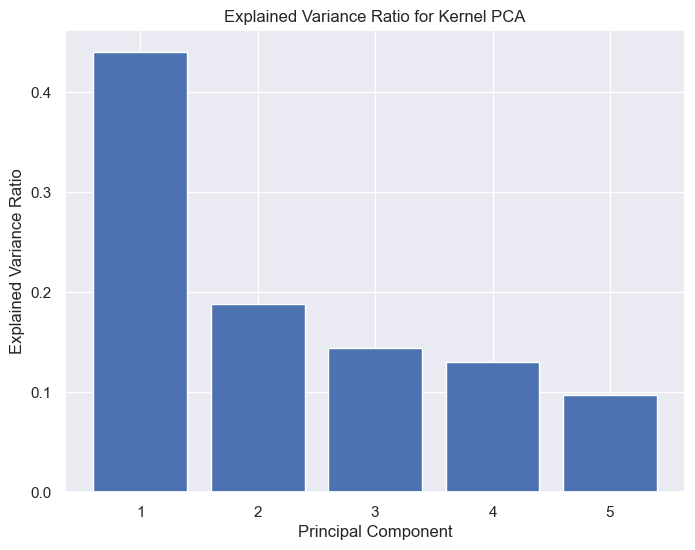

In [54]:
# Utilize the best estimator obtained from grid search
best_kernel_pca = kernelPCA.best_estimator_

# Perform data transformation using the best estimator
transformed_data = best_kernel_pca.fit_transform(subset)

# Calculate the explained variance for each component
explained_variance = np.var(transformed_data, axis=0)
explained_variance_ratio = explained_variance / np.sum(explained_variance)

# Create a bar chart to visualize the explained variance ratio
plt.figure(figsize=(8, 6))
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio for Kernel PCA')
plt.show()

I tried to perform PCA on this subset of data to see if I could reduce the dimension of the database. <br>
With the first two components, we reach approximately 70%, and with three components, just above 80%. <br>
Since I would need to retain 3 or 4 columns out of a total of 6, I won't replace the data.

In [55]:
log_columns = processed_df.drop('Dt_Customer', axis=1).skew().sort_values(ascending=False)
log_columns = log_columns.loc[log_columns > 0.75]

log_columns

Complain                   10.170261
AcceptedCmp2                8.456342
Education_Basic             6.197560
Marital_Status_Widow        5.104680
AcceptedCmp1                3.562851
AcceptedCmp3                3.309957
AcceptedCmp5                3.297067
AcceptedCmp4                3.234223
Education_2n Cycle          2.847107
Marital_Status_Divorced     2.605168
CampaignAcceptanceRate      2.450313
NumDealsPurchases           2.431109
MntSweetProducts            2.134824
MntFruits                   2.109419
MntMeatProducts             2.085921
Response                    1.980554
MntFishProducts             1.926088
WebsiteVisitFrequency       1.903844
NumCatalogPurchases         1.885814
MntGoldProds                1.884541
Education_Master            1.807494
NumWebPurchases             1.388608
Education_PhD               1.381557
Marital_Status_Single       1.378343
AveragePurchaseAmount       1.279227
MntWines                    1.174628
Marital_Status_Together     1.101216
m

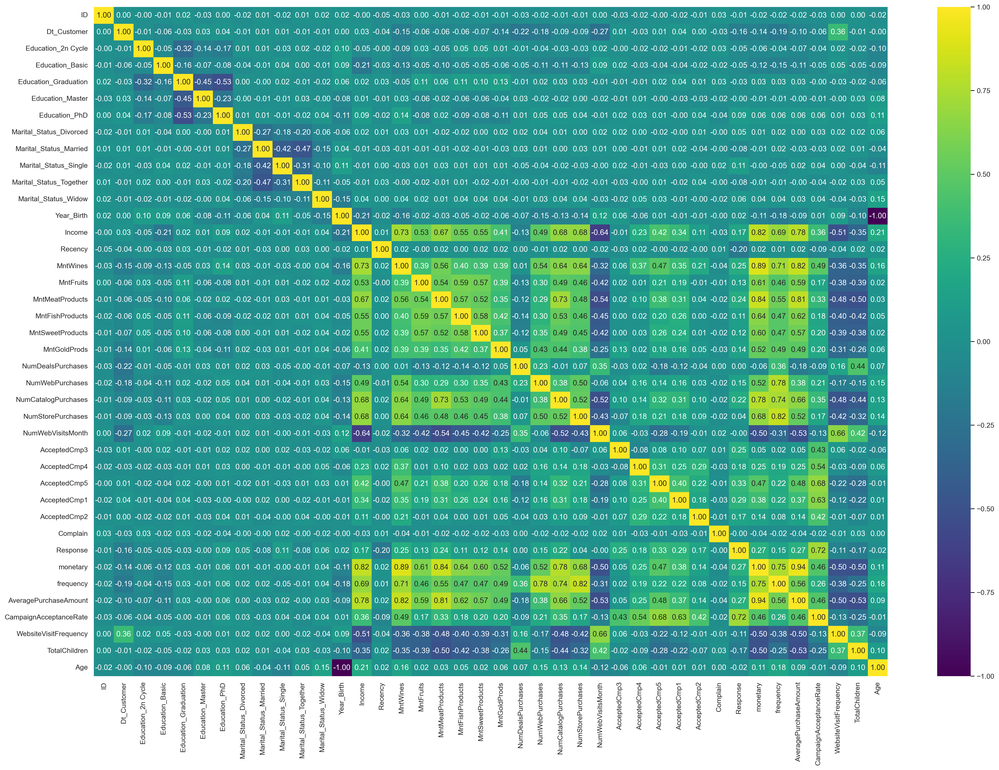

In [56]:
plt.figure(figsize=(28, 19), dpi=250)
sns.heatmap(processed_df.corr(), annot=True, fmt='.2f', cmap='viridis')
plt.show()

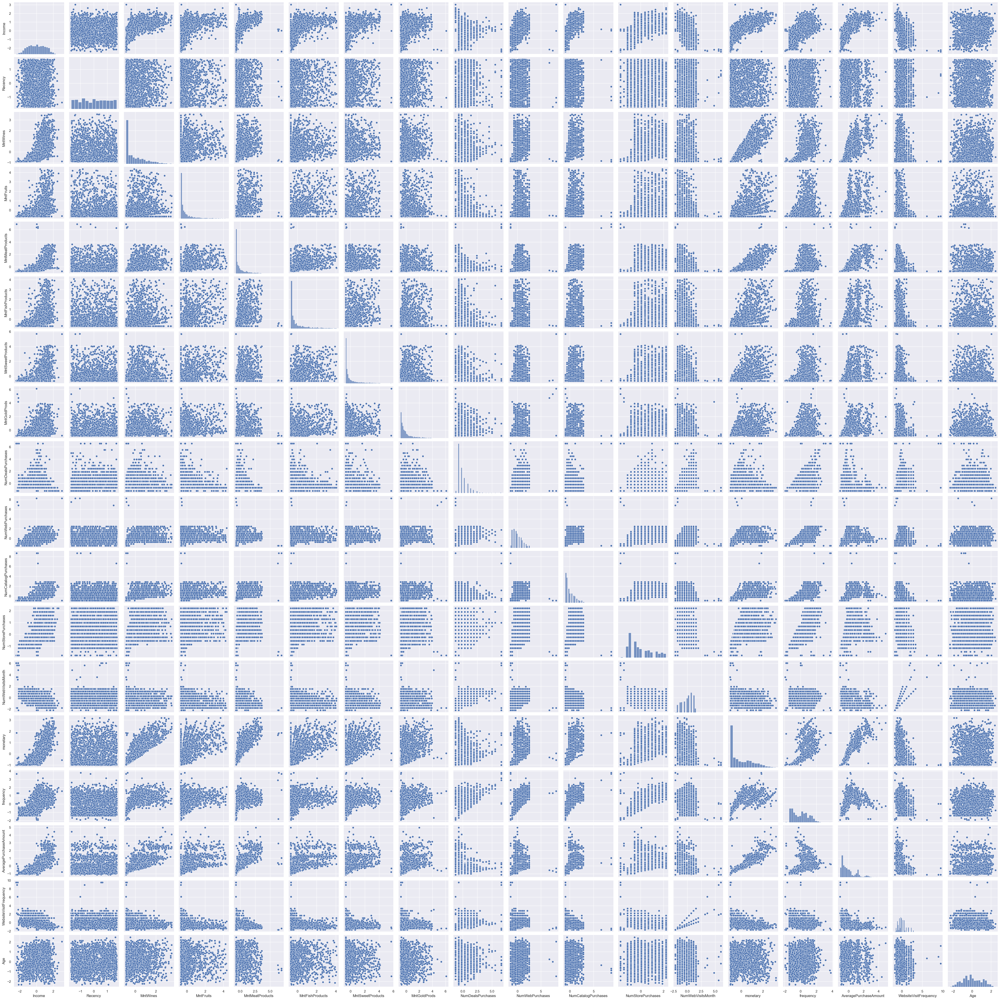

In [57]:
to_do = [col for col in processed_df.columns if len(processed_df[col].unique())>6]
to_remove= ['Dt_Customer', 'ID', 'Year_Birth']
to_do = [col for col in to_do if col not in to_remove]
sns.pairplot(processed_df[to_do])

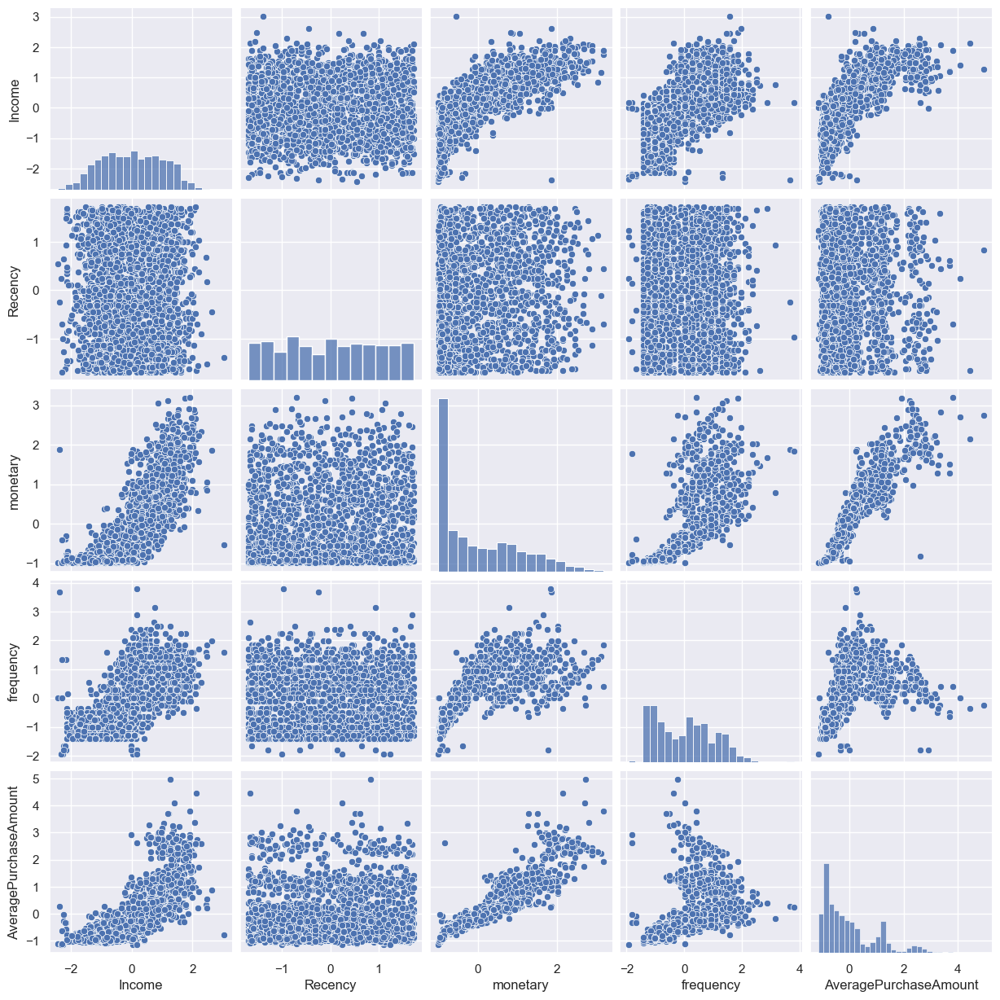

In [58]:
sub = ['Income', 'Recency', 'monetary', 'frequency', 'AveragePurchaseAmount']
sns.pairplot(processed_df[sub]);

---

After completing data inspections and various stages of data preprocessing, I proceed with the Cluster Analysis

---

<a id="clustering"></a>
<h2 style="text-align: center;"><strong>Cluster Analysis</strong></h2>

In [59]:
score_df2 = processed_df.copy()
score_df2['RFM_segmentation'] = score_df['RFM_segmentation']

<a id="kmeans"></a>
<h2 style="text-align: center;"><strong>K-Means</strong></h2>

In [60]:
final_df = processed_df.drop(['Dt_Customer', 'ID'], axis=1)

  File "E:\Anaconda_nav\envs\Data_Science\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "E:\Anaconda_nav\envs\Data_Science\lib\subprocess.py", line 503, in run
    with Popen(*popenargs, **kwargs) as process:
  File "E:\Anaconda_nav\envs\Data_Science\lib\subprocess.py", line 971, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "E:\Anaconda_nav\envs\Data_Science\lib\subprocess.py", line 1456, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,


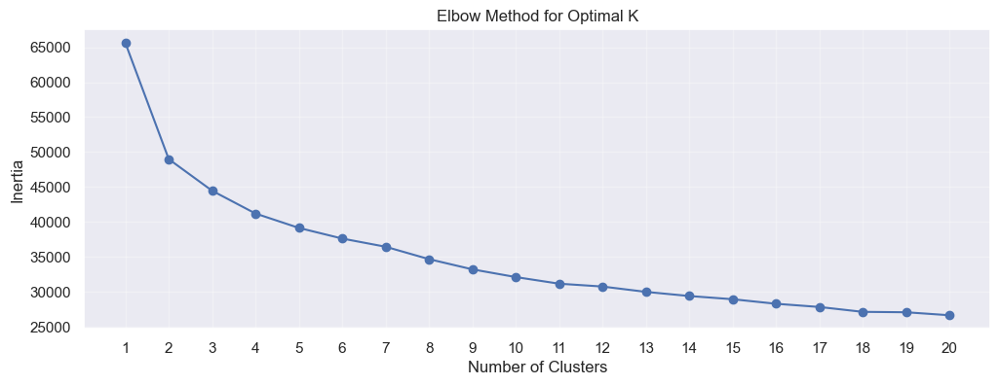

In [61]:
inertia = []
list_num_clusters = list(range(1, 21))
sil_score = []

for num_clusters in list_num_clusters:
    km = KMeans(n_clusters=num_clusters, max_iter=15000)
    km.fit(final_df)
    inertia.append(km.inertia_)
    
    if num_clusters > 1:
        sil_score.append((num_clusters, silhouette_score(final_df, km.labels_)))

plt.figure(figsize=(12, 4))
plt.plot(list_num_clusters, inertia, marker='o', linestyle='-')
plt.xlabel('Number of Clusters')
plt.xticks(list_num_clusters)
plt.grid(alpha=0.3)
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')

plt.show()

In [62]:
sil_score

[(2, 0.27639850100877156),
 (3, 0.24005761754706098),
 (4, 0.18637802283830693),
 (5, 0.18990581606245008),
 (6, 0.10432828347435734),
 (7, 0.10841608627916408),
 (8, 0.11143783926290377),
 (9, 0.1099783637069),
 (10, 0.12136375390458262),
 (11, 0.1215270153261402),
 (12, 0.10516136497671774),
 (13, 0.12428940411748171),
 (14, 0.1110247038518717),
 (15, 0.11839689613844302),
 (16, 0.11225396241733605),
 (17, 0.09631592604327853),
 (18, 0.10269373732175238),
 (19, 0.1172491204925155),
 (20, 0.1015735741552036)]

The cluster values that appear most likely from the **elbow method** seem to be **two**, **three** or **four**. <br>
Instead, from the Silhouette Score, the best numbers appear to be 2, 3, 5, and 7.<br>
I will try with three values: [3, 5, 7].


In [63]:
km = KMeans(n_clusters=3, max_iter=100000)
score_df2['kmeans_k3'] = km.fit_predict(final_df)

In [64]:
km2 = KMeans(n_clusters=5, max_iter=100000)
score_df2['kmeans_k5'] = km2.fit_predict(final_df)

<a id="dbscan"></a>
<h2 style="text-align: center;"><strong>HDBSCAN</strong></h2>

In [66]:
dbscan_col = [col for col in final_df.columns if col not in log_columns[log_columns.values>3]]
dbscan_df = final_df[dbscan_col]

In [67]:
final_df[dbscan_col].skew()

Education_2n Cycle         2.847107
Education_Graduation      -0.016140
Education_Master           1.807494
Education_PhD              1.381557
Marital_Status_Divorced    2.605168
Marital_Status_Married     0.465839
Marital_Status_Single      1.378343
Marital_Status_Together    1.101216
Year_Birth                -0.093564
Income                     0.012632
Recency                   -0.004415
MntWines                   1.174628
MntFruits                  2.109419
MntMeatProducts            2.085921
MntFishProducts            1.926088
MntSweetProducts           2.134824
MntGoldProds               1.884541
NumDealsPurchases          2.431109
NumWebPurchases            1.388608
NumCatalogPurchases        1.885814
NumStorePurchases          0.700763
NumWebVisitsMonth          0.213140
Response                   1.980554
monetary                   0.862627
frequency                  0.255559
AveragePurchaseAmount      1.279227
CampaignAcceptanceRate     2.450313
WebsiteVisitFrequency      1

In [68]:
def evaluate_dbscan_segmentation(data, labels):
    # Calculate the Silhouette score
    silhouette_avg = silhouette_score(data, labels)
    
    # Calculate density metrics
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)  # Number of clusters, excluding noise
    cluster_sizes = [sum(labels == i) for i in range(n_clusters)]  # Size of each cluster
    noise_points = sum(labels == -1)  # Number of noise points

    return {
        'Silhouette Score': silhouette_avg,
        'Number of Clusters': n_clusters,
        'Cluster Sizes': cluster_sizes,
        'Noise Points': noise_points
    }


In [69]:
hdbscan = HDBSCAN()

param_grid = {
    "min_cluster_size": [30, 40, 50, 60],
    "min_samples": [5, 10, 20, 30, 50, 80],
    'cluster_selection_epsilon': [0.01, 0.1, 0.2, 0.5, 0.8],
    'alpha': [.1, .5, 1, 1.5, 2, 3]
}

dbscan_grid = GridSearchCV(estimator=hdbscan, 
                           param_grid=param_grid, 
                           scoring=silhouette_score, 
                           cv=5, 
                           n_jobs=-1
                          )
dbscan_grid.fit(dbscan_df)

# Best parameters and the best score
best_params = dbscan_grid.best_params_
best_score = dbscan_grid.best_score_

# Prints
print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Parameters: {'alpha': 0.1, 'cluster_selection_epsilon': 0.01, 'min_cluster_size': 30, 'min_samples': 5}
Best Score: nan


In [70]:
dbscan_model = HDBSCAN(**best_params)
dbscan_model.fit(final_df)
print(f'HDBSCAN found {len(set(dbscan_model.labels_) - set([-1]))} clusters and {(dbscan_model.labels_ == -1).sum()} points of noise.')

HDBSCAN found 7 clusters and 492 points of noise.


In [71]:
dbscan_model = HDBSCAN(**best_params)
score_df2['HDBSCAN'] = dbscan_model.fit_predict(final_df)

In [72]:
labels = dbscan_model.labels_

# evaluation metrics
evaluation_result = evaluate_dbscan_segmentation(final_df, labels)

# results
print("Silhouette Score:", evaluation_result['Silhouette Score'])
print("Number of Clusters:", evaluation_result['Number of Clusters'])
print("Cluster Sizes:", evaluation_result['Cluster Sizes'])
print("Noise Points:", evaluation_result['Noise Points'])

Silhouette Score: 0.07602117735187543
Number of Clusters: 7
Cluster Sizes: [30, 45, 51, 72, 104, 76, 1362]
Noise Points: 492


These results are not very satisfying; a **Silhouette Score** of approximately 0.076 suggests that the clusters have a significant overlap, or that the data points are not well assigned to the clusters.

<a id="plot"></a>
<h2 style="text-align: center;"><strong>Visual Comparison</strong></h2>

In [73]:
sub = ['Income', 'Recency', 'monetary', 'frequency', 'AveragePurchaseAmount']

### Visualizzation for K-Means with K=3

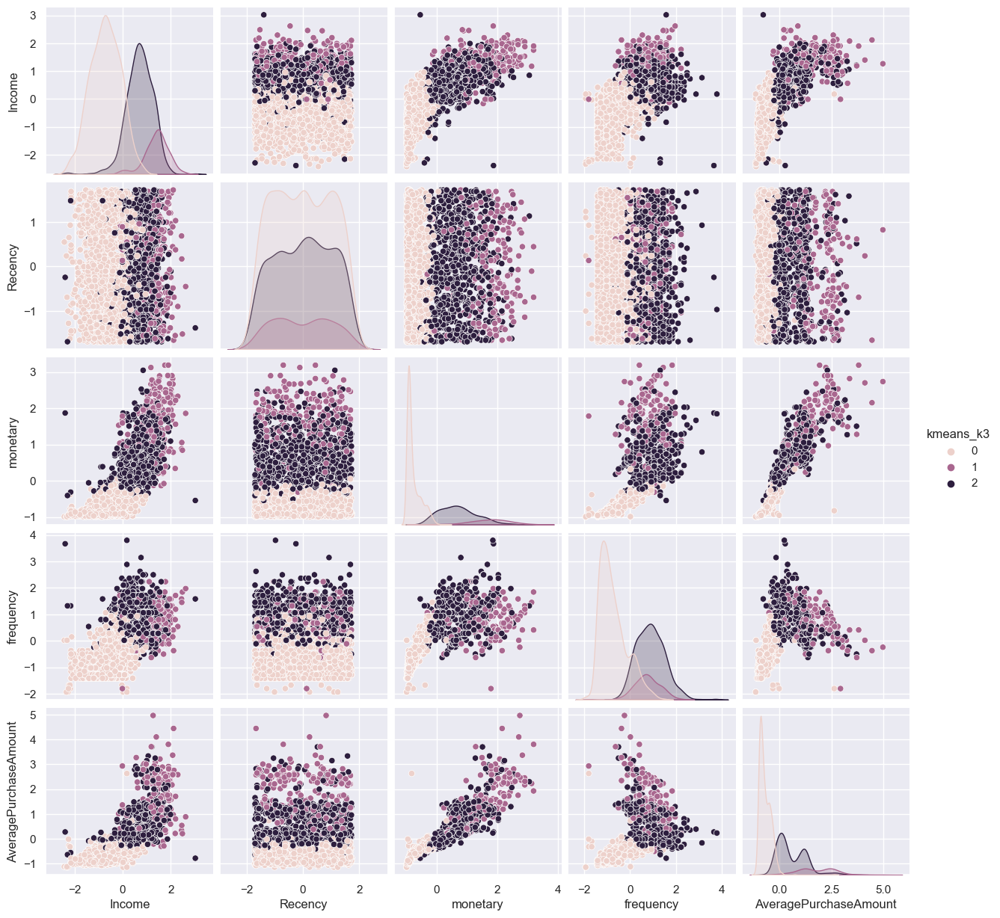

In [74]:
sns.pairplot(data=score_df2, vars=sub, hue='kmeans_k3');

### Visualizzation for K-Means with K=5

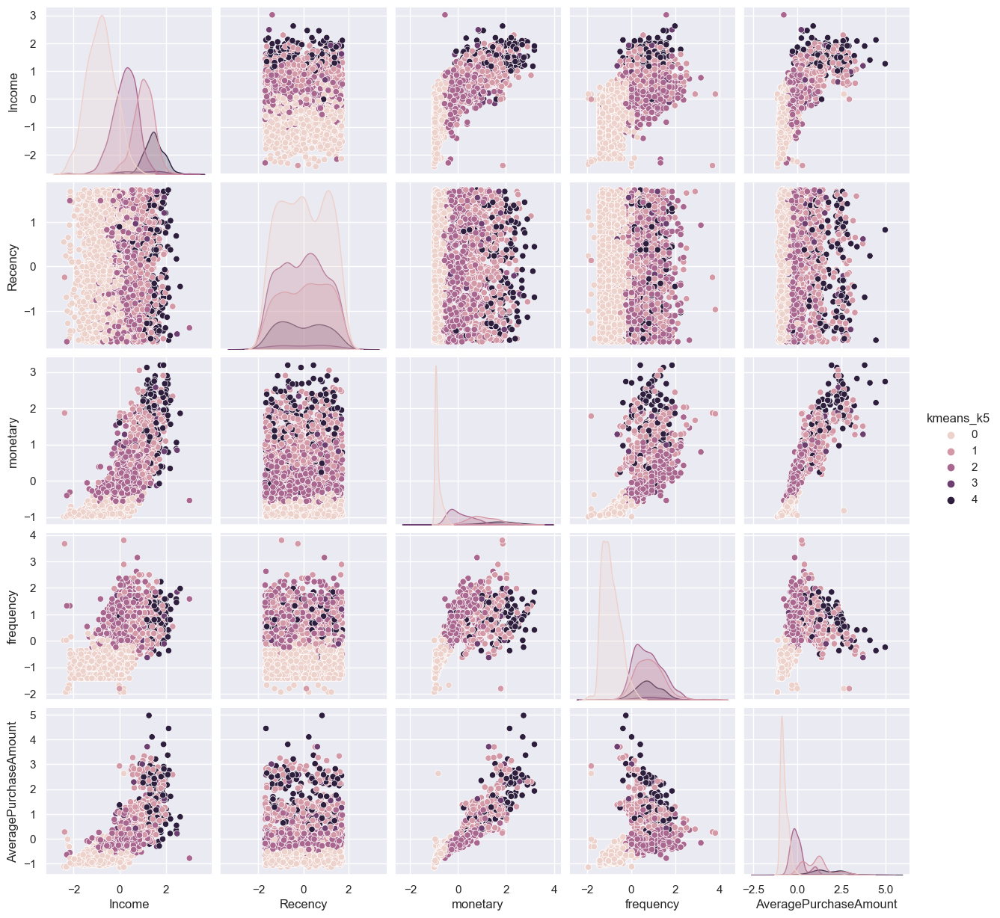

In [75]:
sns.pairplot(data=score_df2, vars=sub, hue='kmeans_k5');

### Visualizzation for HDBSCAN

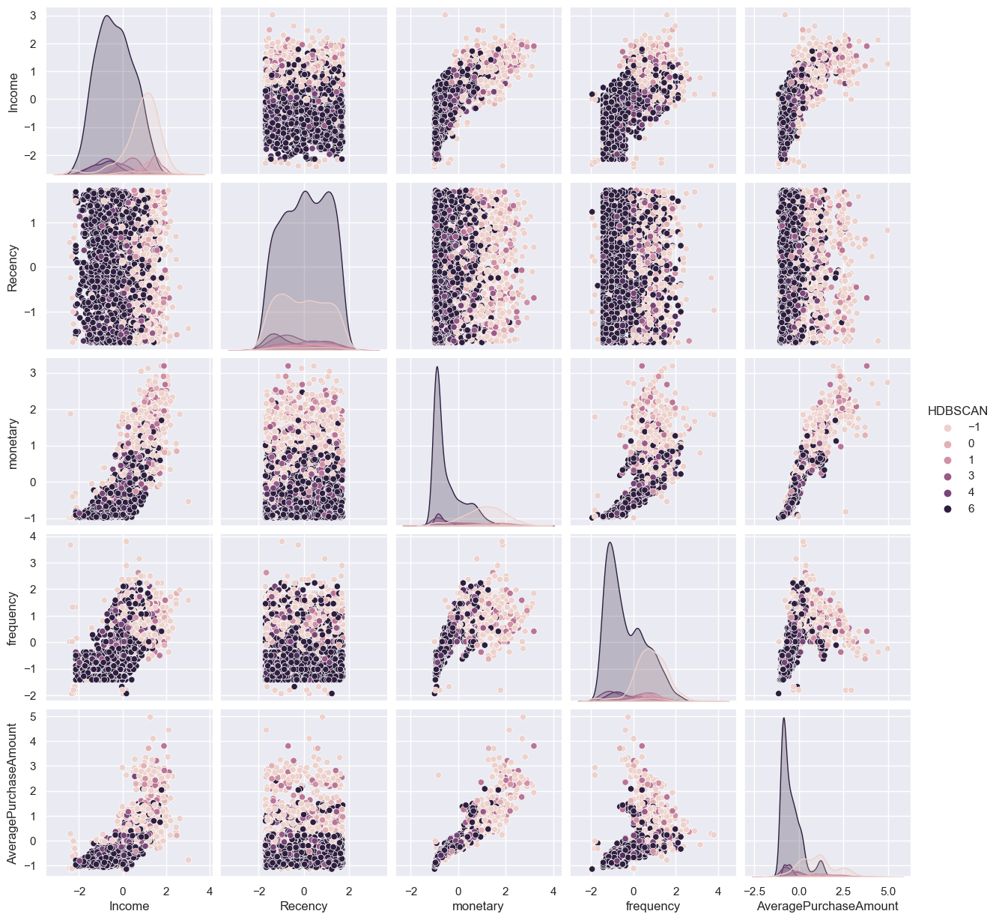

In [77]:
sns.pairplot(data=score_df2, vars=sub, hue='HDBSCAN');

### Visualizzation for RFM Analysis

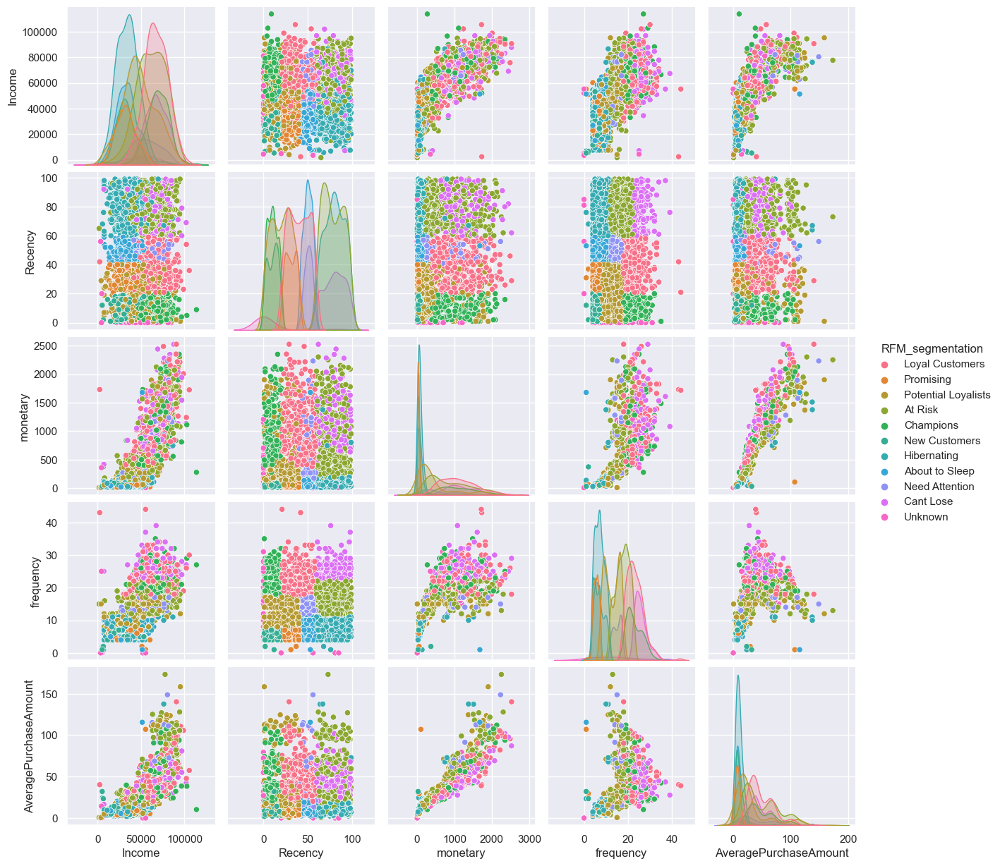

In [78]:
sns.pairplot(data=score_df, vars=sub, hue='RFM_segmentation');

<a id="conclusions"></a>
<h2 style="text-align: center;"><strong>Conclusions</strong></h2>

For customer segmentation, I tried K-Means and HDBSCAN. K-Means identified three, four or seven clusters, and as you can see in the plot, the categories are well separated Except perhaps for k=7, where some data overlap starts to become noticeable.

On the other hand, HDBSCAN didn't perform very well; the data is quite confusing, and there is a significant overlap, making it hard to achieve a clear separation between the classes. 

In conclusion, RFM, although not an Unsupervised Machine Learning model, is widely used for customer segmentation and shows a clear division among the various clusters.